# Restricted Boltzmann Machines: Bounded Continuous Visible Units Following An Exponential Distribution

## Abstract

This notebook implements and demonstrates Restricted Boltzmann Machines (RBMs) with bounded continuous visible units. RBMs are generative models that learn to represent data distributions through unsupervised learning. We explore training on datasets like MNIST, CIFAR-10, STL-10 using Contrastive Divergence (CD) and Persistent Contrastive Divergence (PCD) algorithms.

## Authors

Kai Zhang and Sora Sakai, Department of Chemistry and Biochemistry, The University of Texas at Tyler, 2025

## References

- MNIST dataset: http://yann.lecun.com/, https://www.nist.gov/itl/products-and-services/emnist-dataset
- CIFAR-10 dataset: https://www.cs.toronto.edu/~kriz/cifar.html
- STL-10 dataset: https://ai.stanford.edu/~acoates/stl10/


**Optimal or close-to-optimal training hyperparameters**:

| dataset |split| n_hidden | n_epochs | lr (learning rate) |  CD or PCD| $k$ (MC steps) | update| generation| comments |
|:---------:|:-----------:|:---------:|:-------------:|:----------:|:-------:| :-----:|:------: |:---:|:---:|
|MNIST (unbinarized) | training |512    | 400    | 0.0001        | CD | 10  || $k>100$ OK| E_diff$\sim 470$ high |
|MNIST (unbinarized) | training |512    | 1000    | 0.0001        | CD | 10  |Gibbs | $k\sim 100$ some feature $k\sim 1000$ worse  |  E_diff: 4501.7162, mse: 0.0576 weight clamp used $W\in [-3,5]$ |
|MNIST (unbinarized) | training |512    | 1000    | 0.0001        | PCD | 10  |Gibbs | $k\sim 1000$ some feature but not good |  E_diff: 6031.1633, mse: 0.0716 weight clamp used $W\in [-3,5]$ |
|MNIST (unbinarized) | training |512    | 1000    | 0.0001        | PCD | 10  |Langevin (0.05) reflect | $k\sim 1000$ fail | weight clamp used $W\in [-3,5]$ explode $W \to 5$, E_diff -> 200,000 |
|MNIST (unbinarized) | training |512    | 1000    | 0.0001        | PCD | 10  |Langevin (0.05) absorb | $k\sim 1000$ good (with Ph=0.1) | weight clamp defined $W\in [-3,5]$ but not triggered, $W$ converges to a different minimum, Epoch 1000/1000, E_data: -1733.3347, E_model: -1622.0664, E_diff: 111.2683, mse: 0.0296 |
|MNIST (unbinarized) | training |512    | 1000    | 0.0001        | CD | 10  |Langevin (0.05) absorb | $k\sim 1000$ not diverse, all 1's (with Ph>0.4) | weight clamp defined $W\in [-3,5]$ but not triggered, $W$ converges to a different minimum, Epoch 1000/1000, E_data: -1080.3362, E_model: -997.6865, E_diff: 82.6497, mse: 0.0433|
|MNIST (unbinarized) | training |1024    | 500    | 0.0001        | CD | 10  || $k\sim1000$ good ||
|CIFAR-10 | training |512    | 1000    | 0.0001        | CD | 10  || $k \sim 1000$ some features |E_diff: 32.6140, mse: 0.0961|
|CIFAR-10 | training |512    | 1000    | 0.0001        | PCD | 10  || $k \sim 1000$ some features |E_diff: 32.3078, mse: 0.0962|
|CIFAR-10 | training |512    | 1000    | 0.0001   | PCD | 10  |Langevin (0.05) absorb| $k \sim 1000$ some features |E_diff: 32.0977, mse: 0.0984|
|CIFAR-10 | training |512    | 1000    | 0.0001   | PCD | 10  |Langevin (0.05) reflect| $k \sim 1000$ some features | E_diff: 34.9053, mse: 0.0960|
|CIFAR-10 | training |512    | 1000    | 0.0001   | CD | 10  |Langevin (0.05) reflect| $k \sim 1000$ worse |CD learning slowly E_diff: 4.1827, mse: 0.1164 |
|CIFAR-10 | training |1024    | 500    | 0.0001        | CD | 10  || $k \sim 1000$ bad ||
|STL10 | unlabeled |512    | 500    | 0.01        | PCD | 10  || $k>100$? ||
|STL10 | train |1024    | 1000    | 0.0001        | PCD | 10  |Langevin (0.05) absorb| $k\sim 1000$ some features |weight clamp defined $W\in [-3,5]$ but not triggered; Epoch 1000/1000, E_data: -199.6796, E_model: -172.0105, E_diff: 27.6691, mse: 0.1125|
|STL10 | unlabeled |1024    | 1000    | 0.0001        | PCD | 10  |Langevin (0.05) absorb| $k\sim 1000$ some features |some filters W rows collapse, Epoch 1000/1000, E_data: -736.2830, E_model: -691.3162, E_diff: 44.9668, mse: 0.0835|

---
 **Notes:**

PCD requires stable equilibrium sampling, but in exponential-bounded RBMs, β = Wᵀh + b quickly saturates hidden units

this makes visible units produce nearly identical samples

this collapses W rows

energy gap explodes

hidden units go to all 1

In [6]:
import os
from os import path

import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.nn.functional as F

from torchvision import datasets, transforms
from torch.utils.data import DataLoader

# Set random seed for reproducibility
torch.manual_seed(42)
np.random.seed(42)

In [7]:
# Check PyTorch GPU availability and set device

print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("CUDA device count:", torch.cuda.device_count())

if torch.cuda.is_available():
    print("GPU device name:", torch.cuda.get_device_name(0))

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

PyTorch version: 2.11.0+cu130
CUDA available: True
CUDA device count: 1
GPU device name: NVIDIA GeForce RTX 4090


# 1. Datasets -- use one of the three example datasets

In [8]:
# Define data directory path to where data is downloaded and/or stored.

data_dir = path.join("..", "data")

## 1.1 Load MNIST dataset from torchvision

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.MNIST.html

In [ ]:
# Define data transformation: convert to tensor, flatten, and optionally binarize
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 28x28 -> 784
    # transforms.Lambda(lambda x: torch.round(x))  # binarize decimals to 0,1; comment out this line if continuous values needed
])

# Load MNIST training and test datasets
train_data = datasets.MNIST(root=data_dir, train=True, transform=transform, download=True)
test_data = datasets.MNIST(root=data_dir, train=False, transform=transform, download=True)
print(train_data.data.size(),train_data.targets.size())
print(test_data.data.size(),test_data.targets.size())

# Create data loaders
train_loader = DataLoader(train_data, batch_size=64, shuffle=True, drop_last=True)  # watch out PCD last batch size matching problem
test_loader = DataLoader(test_data, batch_size=64, shuffle=True)

torch.Size([60000, 28, 28]) torch.Size([60000])
torch.Size([10000, 28, 28]) torch.Size([10000])


In [5]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 784])
torch.Size([64])


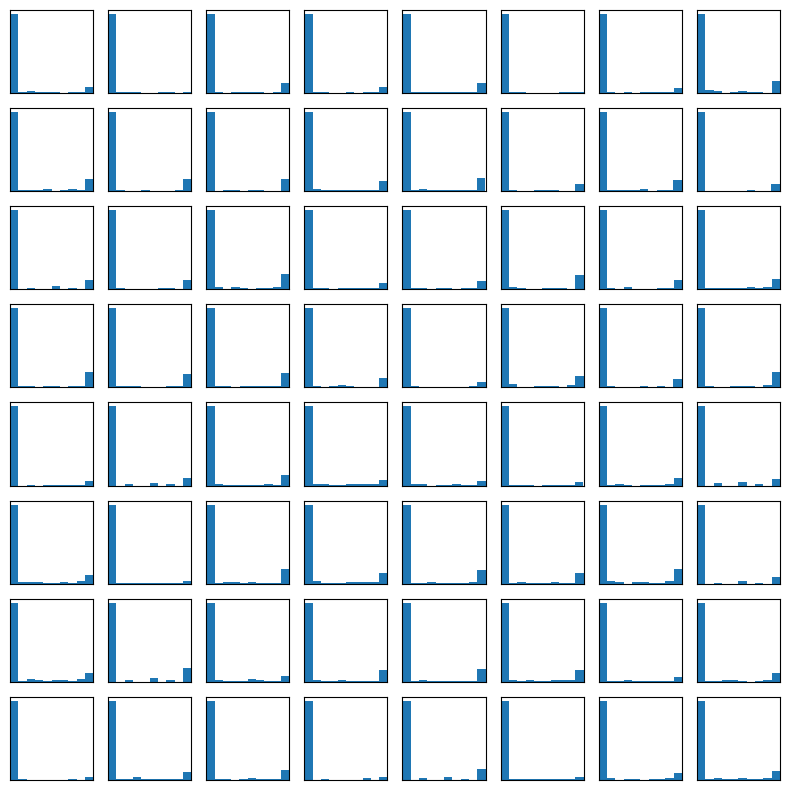

In [ ]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

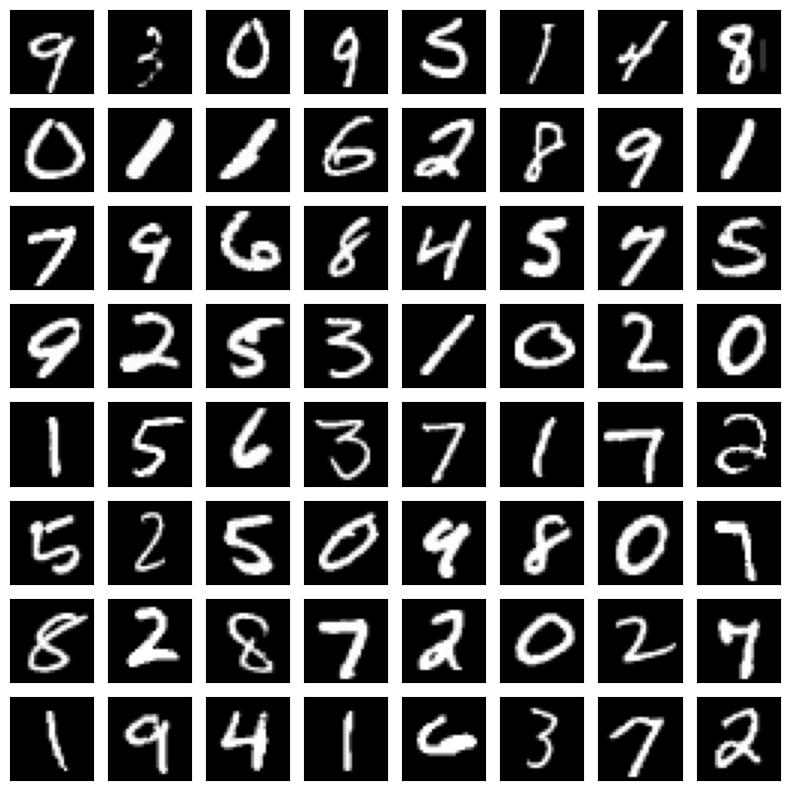

In [ ]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(28, 28), cmap="gray")
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.2 Load CIFAR10 dataset from torchvision

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.CIFAR10.html

https://docs.pytorch.org/vision/0.9/datasets.html#cifar

In [18]:
# Define transformation for CIFAR-10: convert to grayscale, tensor, flatten, and optionally binarize (comment out binarization for continuous values)
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 32x32 -> 1024
])

# Load CIFAR-10 training and test datasets
cifar_train = datasets.CIFAR10(root="./data", train=True, download=True, transform=transform)
cifar_test = datasets.CIFAR10(root="./data", train=False, download=True, transform=transform)
print("Train images:", len(cifar_train))
print("Test images:", len(cifar_test))

# Create data loaders for CIFAR-10
train_loader = DataLoader(cifar_train, batch_size=64, shuffle=True)
test_loader = DataLoader(cifar_test, batch_size=64, shuffle=True)

Train images: 50000
Test images: 10000


In [19]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 1024])
torch.Size([64])


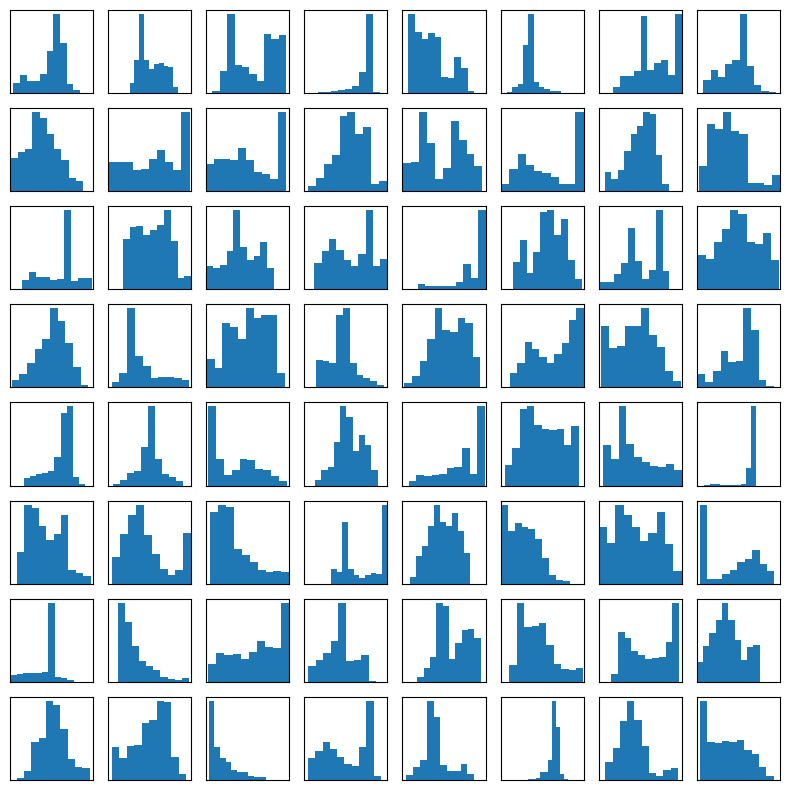

In [ ]:
# See pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

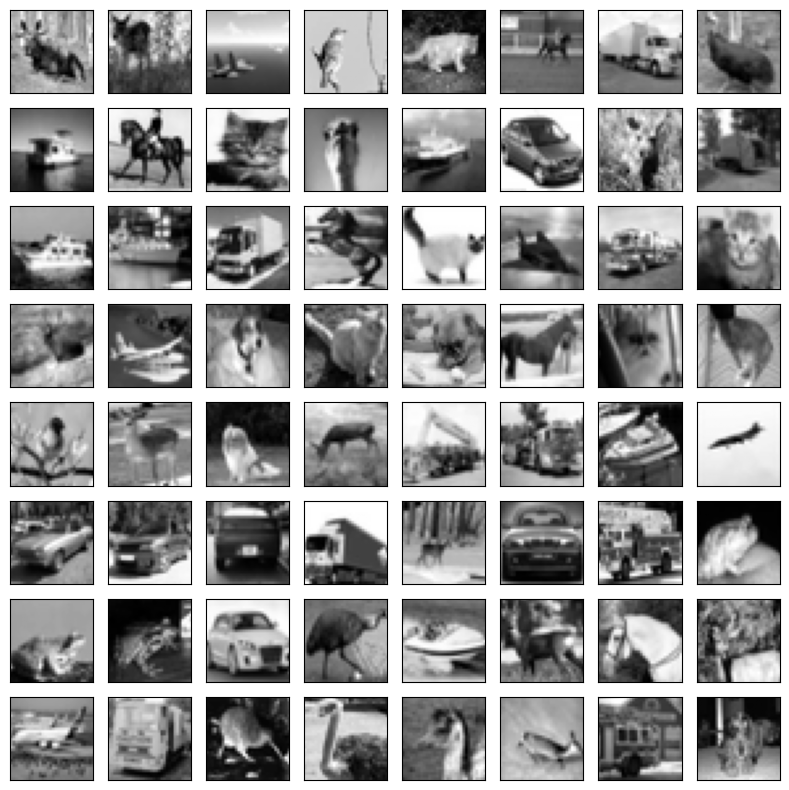

In [ ]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(32, 32), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## 1.3 Load STL-10 dataset from torchvision

https://docs.pytorch.org/vision/main/generated/torchvision.datasets.STL10.html

In [ ]:
# Define transformation for STL-10: grayscale, resize to 32x32, tensor, flatten
transform = transforms.Compose([
    transforms.Grayscale(num_output_channels=1),  # convert to grayscale
    transforms.Resize((32, 32), interpolation=transforms.InterpolationMode.BILINEAR),  # downsampling reduce size from 96x96 to 32x32
    transforms.ToTensor(),
    transforms.Lambda(lambda x: x.view(-1)),  # Flatten 32x32 -> 1024
])

# Load STL-10 datasets
stl10_train = datasets.STL10(root=data_dir, split='train', download=True, transform=transform) 
stl10_test = datasets.STL10(root=data_dir, split='test', download=True, transform=transform) 
stl10_unlabeled = datasets.STL10(root=data_dir, split='unlabeled', download=True, transform=transform)
print("Train images:", len(stl10_train))
print("Test images:", len(stl10_test))
print("Unlabeled images:", len(stl10_unlabeled))

# Create data loaders
train_loader = DataLoader(stl10_train, batch_size=64, shuffle=True, drop_last=False)  # watch out PCD last batch size matching problem
test_loader = DataLoader(stl10_test, batch_size=64, shuffle=True, drop_last=False)  # y = 0-9
unlabeled_loader = DataLoader(stl10_unlabeled, batch_size=64, shuffle=True, drop_last=False)  # y = -1

Train images: 5000
Test images: 8000
Unlabeled images: 100000


In [15]:
# Get a batch and inspect shapes

X_batch, y_batch = next(iter(test_loader))
print(X_batch.shape)
print(y_batch.shape)

torch.Size([64, 1024])
torch.Size([64])


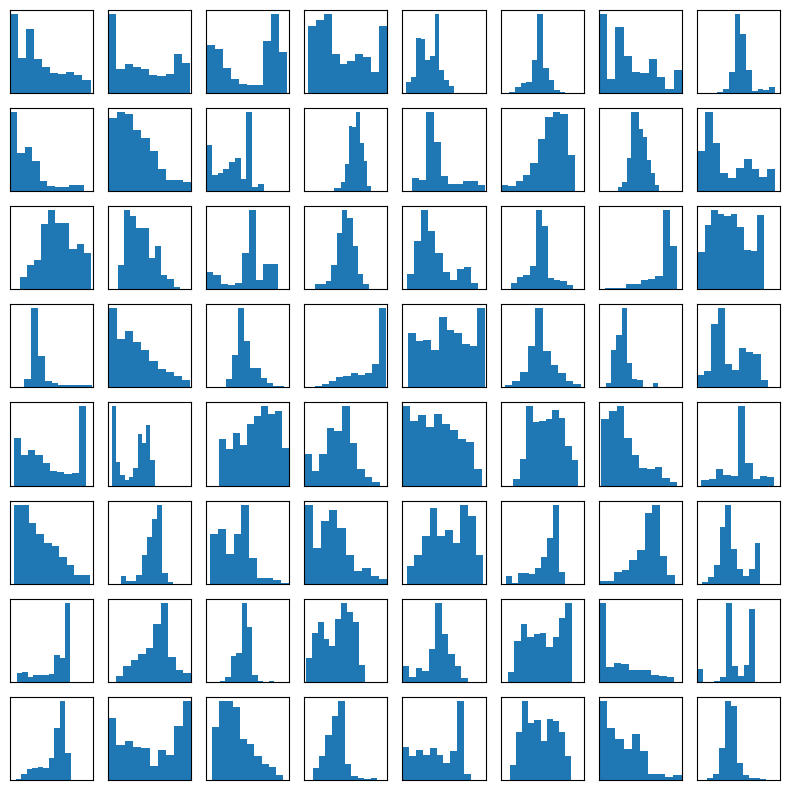

In [ ]:
# see pixel distributions

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.hist(X_batch[i].cpu().view(-1)) 
    ax.set_xlim(0,1)
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

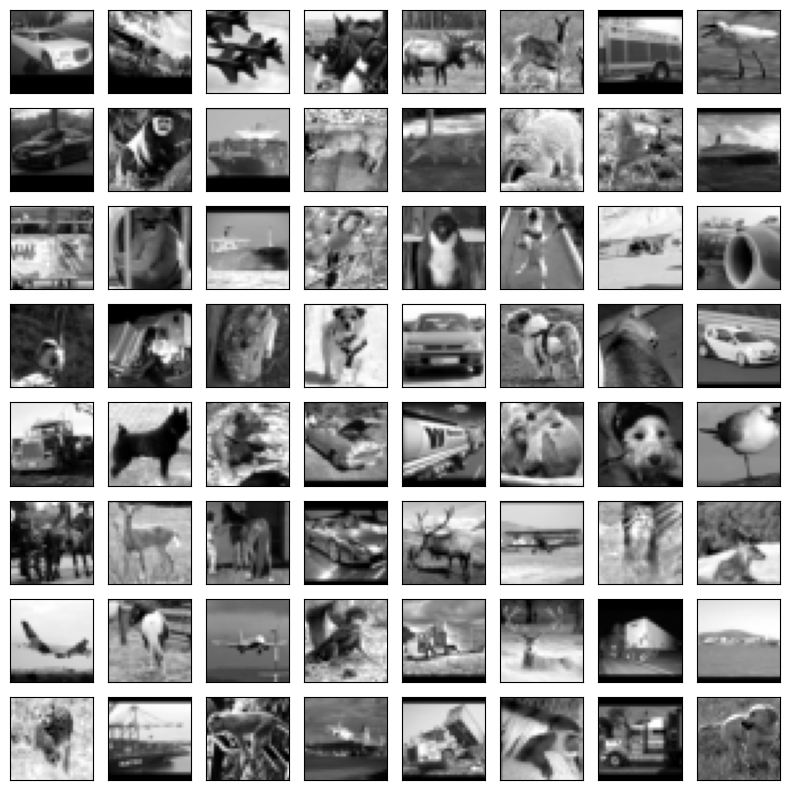

In [ ]:
# See sample images

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(X_batch[i].cpu().view(32, 32), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# 2. Define RBM with truncated exponential visible units

In [ ]:
class RBM_exponential(nn.Module):
    """
    RBM with bounded exponential visible units and binary hidden units
    variance parameter sigma_j is set to 1
    parameters: W, b, c
    learning with Markov Chain Monte Carlo methods
    CD-k or PCD-k 
    update parameters for one batch
    calculate data visible energy and model visible energy
    difference between data and model visible energies
    one-step reconstruction mse
    """
    def __init__(self, n_visible, n_hidden):
        super(RBM_exponential, self).__init__()
        self.n_visible = n_visible  # nv
        self.n_hidden = n_hidden  # nh

        # Model parameters
        self.W = nn.Parameter(torch.randn(n_hidden, n_visible) * 0.01)  # (nh, nv)
        self.v_bias = nn.Parameter(torch.zeros(n_visible))  # (nv, )
        self.h_bias = nn.Parameter(torch.zeros(n_hidden))  # (nh, )
      
        # Persistent chain for PCD
        self.persistent_v = None

    def alpha(self, v):
        """
        v^T/sigma^T W^T + c  
        input_shape: [batch_size, nv]
        output shape: [batch_size, nh]
        """
        return F.linear(v, self.W, self.h_bias)
    
    def beta(self, h):
        """
        h^TW + b 
        input_shape: [batch_size, nh]
        output shape: [batch_size, nv]
        """
        return F.linear(h, self.W.t(), self.v_bias)
        
    def bernoulli_sampling(self, p):
        """Sample from Bernoulli distribution with probability p."""
        return torch.bernoulli(p)

    def v_to_h(self, v):
        """
        Compute p(h|v) = sigmoid(Wv + c)
        and sample v -> h
        input_shape: [batch_size, nv]
        output shape: [batch_size, nh]
        """
        p_h = torch.sigmoid(self.alpha(v))
        # p_h = torch.clamp(p_h, 0.0, 1.0)
        return self.bernoulli_sampling(p_h)

    def h_to_v(self, h):
        """
        Compute beta = h^TW + b
        and sample h -> v following exponential distribution
        given a uniform r.v.  0<u<1;
        sample r.v. x subject to f(x) = k exp(kx)/(exp(k)-1)
        input_shape: [batch_size, nh]
        output shape: [batch_size, nv]
        """
        hxw_b = self.beta(h)
        clip_hxw_b = torch.clamp(hxw_b, -50.0, 50.0)  # 50 better than 10

        u = torch.rand_like(hxw_b)

        small_beta_mask = clip_hxw_b.abs() < 1e-12

        exp_b  = torch.exp(clip_hxw_b)
        arg = (exp_b - 1.) * u + 1.
        arg = torch.clamp(arg, 1e-12, 1e12)
        v_exp = torch.log(arg) / clip_hxw_b  # + 1e-10) #clip_hxw_b

        v = torch.where(small_beta_mask, u, v_exp)
       
        return v.clamp(0,1) 
    
    def langevin_update(self, v, epsilon=0.1):
        """
        One Langevin step: v(t+1) = v(t) - epsilon^2/2 * dE/dv + epsilon*noise

        Absorbing boundaries: v(t+1).clamp(0,1) 
            if v < 0  -> v = 0
            if v > 1  -> v = 1
        or Boundary reflection:
            if v < 0  -> v = -v
            if v > 1  -> v = 2 - v
        """
        v = v.view(-1, self.n_visible)  # [batch_size, nv]
       
        # if to use auto_diff
        # v = v.detach().clone().requires_grad_(True)
        # E = self.visible_energy(v).sum() # sum over batch
        # grad_v = torch.autograd.grad(E, v)[0] # dE/dv

        # if to calculate gradient dE/dv manually
        # grad_v = -self.beta(self.v_to_h(v)) # -log p(v|h) approximation
        grad_v = -self.v_bias.t() - torch.sigmoid(self.alpha(v)) @ self.W  # [batch_size, nv]
        
        # Gaussian noise
        noise = torch.randn_like(v)  # [batch_size, nv]

        # Langevin update
        v_new = v - (epsilon**2/2.) * grad_v + epsilon * noise

        # ---- Reflecting boundaries ----
        # mask_low = v_new < 0     # reflect below 0
        # v_new = torch.where(mask_low, -v_new, v_new)
        # mask_high = v_new > 1 # reflect above 1
        # v_new = torch.where(mask_high, 2 - v_new, v_new)

        return v_new.clamp(0,1) # torch.sigmoid(v_new).detach()
        
    def forward(self, v, mc='gibbs', k=1, epsilon=0.1):
        """
        Performs k-step Gibbs sampling v->h->v' or
        k-step Langevin dynamics sampling v->v'
        """
        v = v.view(-1, self.n_visible)  # [batch_size, nv]
      
        if mc == 'gibbs':
            with torch.no_grad():  # Gibbs does not need to do auto_diff
                for _ in range(k):
                    h = self.v_to_h(v)
                    v = self.h_to_v(h)
                    
        elif mc == 'langevin':  # Langevin MUST keep autograd to use it
            for _ in range(k):
                v = self.langevin_update(v, epsilon)
                                
        return v  #.detach()   

    def visible_energy(self, v):
        """Compute the visible energy E(v)."""
        vbias_term = v.mv(self.v_bias)  # b^T v: [batch_size, nv] x [nv, 1] = [batch_size, 1]
        # vbias_term = torch.sum(v * self.v_bias, dim=1)
        wxv_c = self.alpha(v)  # Wv + c: [batch_size, nh]
        hidden_term = torch.sum(F.softplus(wxv_c), dim=1)  # [batch_size, 1]
        return -vbias_term - hidden_term


    def contrastive_divergence(self, v0, pcd=False, mc='gibbs', k=1, epsilon=0.1, lr=0.001):
        """
        Perform gradient descent for one batch
        with k-step Contrastive Divergence 
        """
        v_batch = v0.view(-1, self.n_visible)  # [batch_size, nv] 
        p_h_batch = torch.sigmoid(self.alpha(v_batch))  # [batch_size, nh]

        # Initialize persistent chain the first time
        if self.persistent_v is None:
            self.persistent_v = v_batch.detach().clone()

        # Data term
        self.W.grad = -torch.matmul(p_h_batch.t(), v_batch)/v_batch.size(0)  # [nh, nv]
        self.h_bias.grad = -torch.mean(p_h_batch, dim=0)  # [nh]
        self.v_bias.grad = -torch.mean(v_batch, dim=0)  # [nv] (v_j-b_j) but b_j will cancel

        # Gibbs sampling
        if pcd == True: # PCD
            self.persistent_v = self.persistent_v.detach()
            v_sample = self.forward(self.persistent_v, mc, k, epsilon)  # [batch_size, nv]
            self.persistent_v = v_sample.detach().clone()           
        else: # CD
            v_sample = self.forward(v_batch, mc, k, epsilon)  # [batch_size, nv]
        
        p_h_sample= torch.sigmoid(self.alpha(v_sample))  # [batch_size, nh]

        # self.W.grad = None
        # self.v_bias.grad = None
        # self.h_bias.grad = None
        
        # Data term - model term
        self.W.grad -= -torch.matmul(p_h_sample.t(), v_sample)/v_sample.size(0)  # [nh, nv]
        self.h_bias.grad -= -torch.mean(p_h_sample, dim=0)  # [nh]
        self.v_bias.grad -= -torch.mean(v_sample, dim=0)  # [nv]

        # Update parameters manually by gradient descent
        for param in [self.W, self.v_bias, self.h_bias]:
            param.data -= lr * param.grad

        # Clamp values of weights
        self.W.data.clamp_(-3, 5)
        
        E_data = torch.mean(self.visible_energy(v_batch))
        E_model = torch.mean(self.visible_energy(v_sample))       
        E_diff = E_model - E_data 
        # loss = nn.MSELoss(reduction='mean') 
        # MSE = loss(v_sample, v_batch) 
        
        v_recon = self.forward(v_batch, mc='gibbs', k=1)
        MSE = torch.mean((v_recon - v_batch)**2)  # clamp v' into [0,1]
        
        return E_data, E_model, E_diff, MSE

In [23]:
# Define RBM model

p = 32
n_visible = p*p  # 32x32 pixels or 28x28 for MNIST
n_hidden = 1024  # hidden units

rbm = RBM_exponential(n_visible, n_hidden).to(device)

# 3. Define and run the training loops

In [24]:
def train(model, train_loader, pcd, mc, k, epsilon, lr, n_epochs):
    """
    Train the RBM model using Contrastive Divergence or Persistent Contrastive Divergence.

    Parameters:
    - model: RBM model instance
    - train_loader: DataLoader for training data
    - pcd: Boolean, True for PCD, False for CD
    - mc: MCMC method, 'gibbs' or 'langevin'
    - k: Number of MCMC steps
    - epsilon: Step size for Langevin dynamics
    - lr: Learning rate
    - n_epochs: Number of training epochs

    Returns:
    - history: Dictionary with training metrics
    """
    if pcd:
        print(f"Training with PCD and {k}-step {mc} updates")
    else:
        print(f"Training with CD and {k}-step {mc} updates")
    
    history = {"E_data": [], "E_model": [], "E_diff": [], "mse": []}

    for epoch in range(n_epochs):
        E_data_epoch, E_model_epoch, E_diff_epoch, mse_epoch = 0., 0., 0., 0.
        for _, batch_data in enumerate(train_loader):
            X_train = batch_data[0] if isinstance(batch_data, list) else batch_data
            X_train = X_train.to(device)
            E_data, E_model, E_diff, mse = model.contrastive_divergence(X_train, pcd, mc, k, epsilon, lr)
            E_data_epoch += E_data.item()
            E_model_epoch += E_model.item()
            E_diff_epoch += E_diff.item()
            mse_epoch += mse.item()
        
        E_data_epoch /= len(train_loader)
        E_model_epoch /= len(train_loader)
        E_diff_epoch /= len(train_loader)
        mse_epoch /= len(train_loader)
        
        history["E_data"].append(E_data_epoch)
        history["E_model"].append(E_model_epoch)

        history["E_diff"].append(E_diff_epoch)
        history["mse"].append(mse_epoch)
            
        print(f"Epoch {epoch + 1}/{n_epochs}, E_data: {E_data_epoch:.4f}, E_model: {E_model_epoch:.4f}, E_diff: {E_diff_epoch:.4f}, mse: {mse_epoch:.4f}")

    return history

In [25]:
# Define training hyperparameters

n_epochs = 1000
lr = 0.0001
k = 10
pcd = True
mc = 'langevin'  # gibbs or langevin
epsilon= 0.05  # langevin step size

cdtype = 'pcd' if pcd else 'cd'

In [ ]:
# Run training. Replace train_loader with unlabeled_loader for STL10 if you want to train on unlabeled data.

history = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs)

Training with PCD and 10-step langevin updates
Epoch 1/1000, E_data: -661.8488, E_model: -660.1056, E_diff: 1.7432, mse: 0.1398
Epoch 2/1000, E_data: -614.6557, E_model: -613.4318, E_diff: 1.2240, mse: 0.1389
Epoch 3/1000, E_data: -595.6853, E_model: -595.2136, E_diff: 0.4717, mse: 0.1386
Epoch 4/1000, E_data: -583.5163, E_model: -582.4083, E_diff: 1.1080, mse: 0.1383
Epoch 5/1000, E_data: -574.3908, E_model: -572.3386, E_diff: 2.0522, mse: 0.1379
Epoch 6/1000, E_data: -561.2930, E_model: -557.7350, E_diff: 3.5580, mse: 0.1375
Epoch 7/1000, E_data: -547.3712, E_model: -541.8400, E_diff: 5.5312, mse: 0.1370
Epoch 8/1000, E_data: -529.0249, E_model: -521.7822, E_diff: 7.2427, mse: 0.1365
Epoch 9/1000, E_data: -509.9415, E_model: -500.8649, E_diff: 9.0766, mse: 0.1360
Epoch 10/1000, E_data: -491.9502, E_model: -481.3407, E_diff: 10.6094, mse: 0.1354
Epoch 11/1000, E_data: -475.9629, E_model: -463.6485, E_diff: 12.3145, mse: 0.1349
Epoch 12/1000, E_data: -461.8988, E_model: -447.8644, E_di

In [ ]:
# Resume Training
n_epochs = 1

history_temp = train(rbm, train_loader, pcd, mc, k, epsilon, lr, n_epochs)

for key in history:
    history[key].extend(history_temp[key])

n_epochs = len(history["E_data"])
print("Total epochs: ", n_epochs)

In [ ]:
'''
Specfiy output directory and the directory name.
Resulting file structure will be:
├── out_dir
    ├── checkpoints
    |   └── dir_name
    ├── figures
    |   └── dir_name
    └── history
        └── dir_name
'''

out_dir = path.join("..", "outputs")
run_name = "Exponential1"

checkpoints_dir = path.join(out_dir, "checkpoints", run_name)
figures_dir = path.join(out_dir, "figures", run_name)
history_dir = path.join(out_dir, "history", run_name)

os.makedirs(checkpoints_dir, exist_ok=True)
os.makedirs(figures_dir, exist_ok=True)
os.makedirs(history_dir, exist_ok=True)

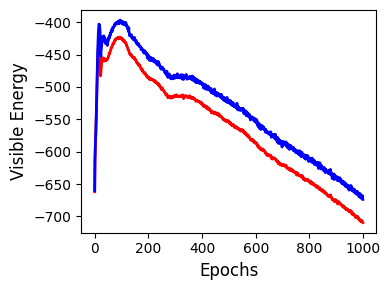

In [ ]:
# Plot Visible Energies vs. Epochs and Save image

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
axes.plot(history["E_data"],'r-', linewidth=2)
axes.plot(history["E_model"],'b-', linewidth=2)

axes.set_ylabel("Visible Energy", fontsize=12)
axes.set_xlabel("Epochs", fontsize=12)

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'VEvsEpochs'), dpi = 600, bbox_inches='tight')

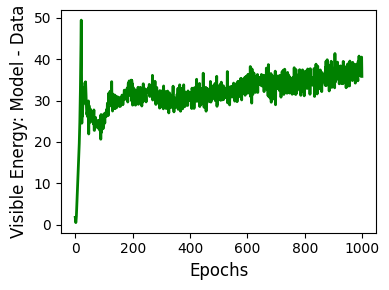

In [ ]:
# Plot Visible Energy Difference vs. Epochs and Save image

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(4, 3))
axes.plot(history["E_diff"],'g-', linewidth=2)

axes.set_ylabel("Visible Energy: Model - Data", fontsize=12)
axes.set_xlabel("Epochs", fontsize=12)

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'VEdiffvsEpochs'), dpi = 600, bbox_inches='tight')

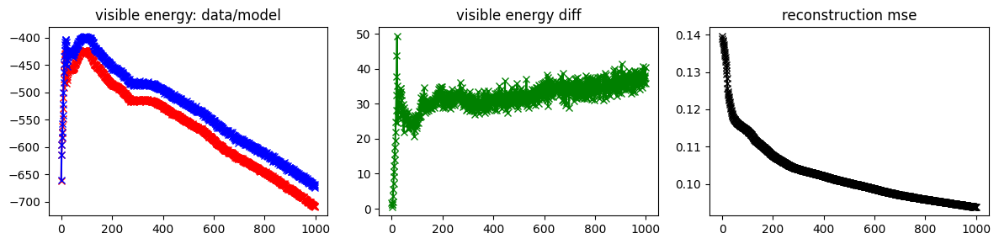

In [ ]:
# Plot history

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(12, 3))

axes[0].plot(history["E_data"],'rx-')
axes[0].plot(history["E_model"],'bx-')

axes[1].plot(history["E_diff"],'gx-')
axes[2].plot(history["mse"],'kx-')


axes[0].set_title('visible energy: data/model')
axes[1].set_title('visible energy diff')
axes[2].set_title('reconstruction mse')

plt.tight_layout()
plt.show()

fig.savefig(path.join(figures_dir, 'training_history.png'), dpi=600, bbox_inches='tight')

# 4. Optional saving and reloading steps

## (4.1) Save model parameters and training results

In [ ]:
# Save parameters as numpy array files

for name, param in rbm.state_dict().items():
    print(f'parameter: {name}, size: {param.size()}')
    np.save(os.path.join(checkpoints_dir, f"{name}.npy"), param.cpu().numpy())

np.save(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), history, allow_pickle=True)  # save a list of dictionary

parameter: W, size: torch.Size([1024, 1024])
parameter: v_bias, size: torch.Size([1024])
parameter: h_bias, size: torch.Size([1024])


## (4.2) Reload parameters or training results

In [ ]:
################################################
# To load parameters from npy file
################################################

state_dict = rbm.state_dict()  # get a copy of current state dict
for name in state_dict.keys():
    param = np.load(os.path.join(checkpoints_dir, f"{name}.npy"))
    state_dict[name] = torch.tensor(param)

rbm.load_state_dict(state_dict)  # this actually loads the parameters

training_history = np.load(os.path.join(history_dir, f"training_nh{n_hidden}{cdtype}-{k}{mc}_lr{lr}.npy"), allow_pickle=True).tolist()  # a list of dictionary

# 5. Reconstruction test

In [ ]:
# Reconstruction using a small batch

# Get batch
test_batch = next(iter(test_loader))
X_test = test_batch[0] if isinstance(test_batch, list) else test_batch

# Reconstruction from first 10 in batch
X_test = X_test[:10].round().to(device)

In [ ]:
# Reconstruction Using the entire test dataset

X_test = test_loader.dataset
X_test = X_test.to(device)

In [ ]:
# Use Gibbs sampling for generation

with torch.no_grad():  # no graph, avoid GPU memory growth
    X_recon = rbm.forward(X_test, mc='gibbs', k=1).detach() 
# X_recon = X_recon.clamp(0,1)

In [ ]:
# Use Langevin dynamics for generation

X_gen = rbm.forward(X_test, mc='langevin', k=1, epsilon=epsilon).detach()  # langevin autodiff must use graph, GPU memory cautious
# X_gen = X_gen.clamp(0,1) 

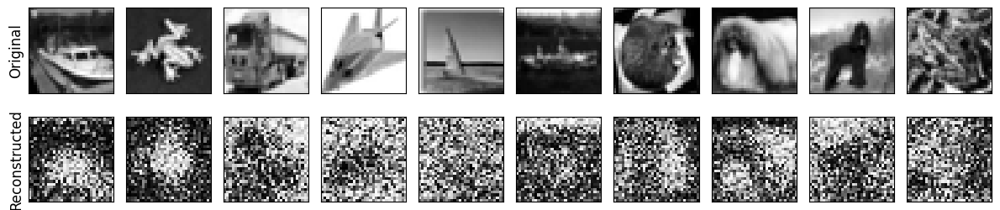

In [35]:
# See Reconstructed vs Original images

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].imshow(X_test[i].cpu().view(p, p), cmap="grey")
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    axes[1, i].imshow(X_recon[i].cpu().view(p, p), cmap="grey")
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)


plt.tight_layout()
plt.show()

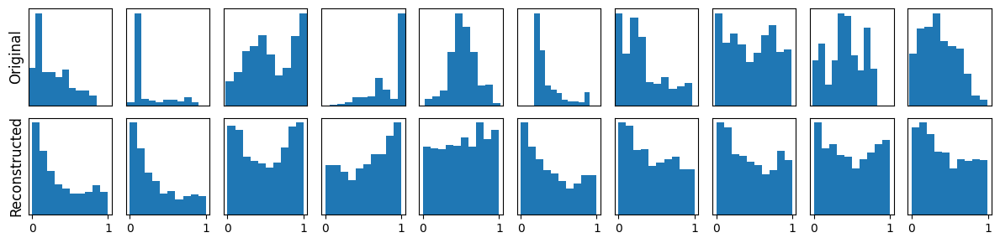

In [36]:
# Check histogram distribution

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(X_test[i].cpu().view(-1)) 
    axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(X_recon[i].cpu().view(-1)) 
    # axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    # axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

## Check hidden unit histogram

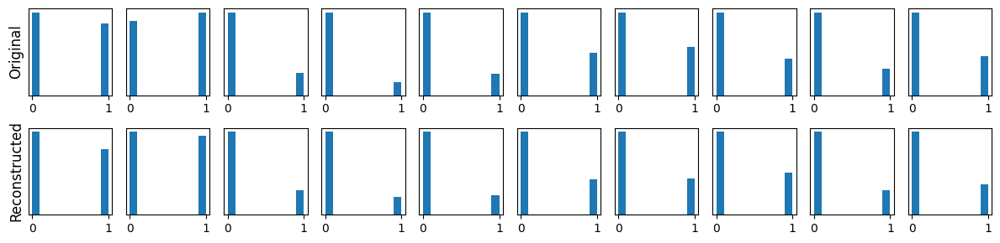

In [37]:
h_test = rbm.v_to_h(X_test.to(device)).detach() 
h_recon = rbm.v_to_h(X_recon.to(device)).detach()

fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(h_test[i].cpu().view(-1)) 
    # axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    # axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(h_recon[i].cpu().view(-1)) 
    # axes[1, i].axis("off")
    # axes[1, i].set_xticks([])
    # axes[1, i].set_xlim(0,1)
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Reconstructed", fontsize=12)

plt.tight_layout()
plt.show()

# 6.  Generation from random start

It is easier to generate from random binary ${\bf h}_0$ to initialize a valid starting visible units ${\bf h}_0 \to {\bf v}_0$.

In [ ]:
# Generate starting from a random pixel distribution or a random hidden unit distribution.
# Commented out lines are for different initializations.

n_sample = 256

ph = 0.1 # Bernoulli probability
h0 = torch.bernoulli(torch.ones(n_sample, n_hidden)*ph).float().to(device) # bernoulli 0,1 with probability ph
X0 = rbm.h_to_v(h0)

# X0 = torch.rand((n_sample, n_visible),requires_grad=False).float().to(device)  # uniform [0,1]
# X0 = torch.randint(1, (n_sample, n_visible),requires_grad=False).float().to(device)  # uniform binary 0,1
# X0 = torch.bernoulli(torch.ones(n_sample, n_visible)*0.3).float().to(device)  # bernoulli 0,1 with probability
# X0 = (0.8+0.1*torch.randn((n_sample, n_visible),requires_grad=False)).clamp(0,1).float().to(device)

In [ ]:
# Use Gibbs sampling for generation

with torch.no_grad():  # no graph for gibbs, avoid GPU memory growth
    X_gen = rbm.forward(X0, mc='gibbs', k=100, epsilon=0.001).detach()  # gibbs or manual diff langevin does not need graph
# X_gen = X_gen.clamp(0,1)

In [ ]:
# Use Langevin dynamics for generation

X_gen = rbm.forward(X0, mc='langevin', k=1000, epsilon=epsilon).detach()  # langevin autodiff must use graph, GPU memory cautious
# X_gen = X_gen.clamp(0,1)    

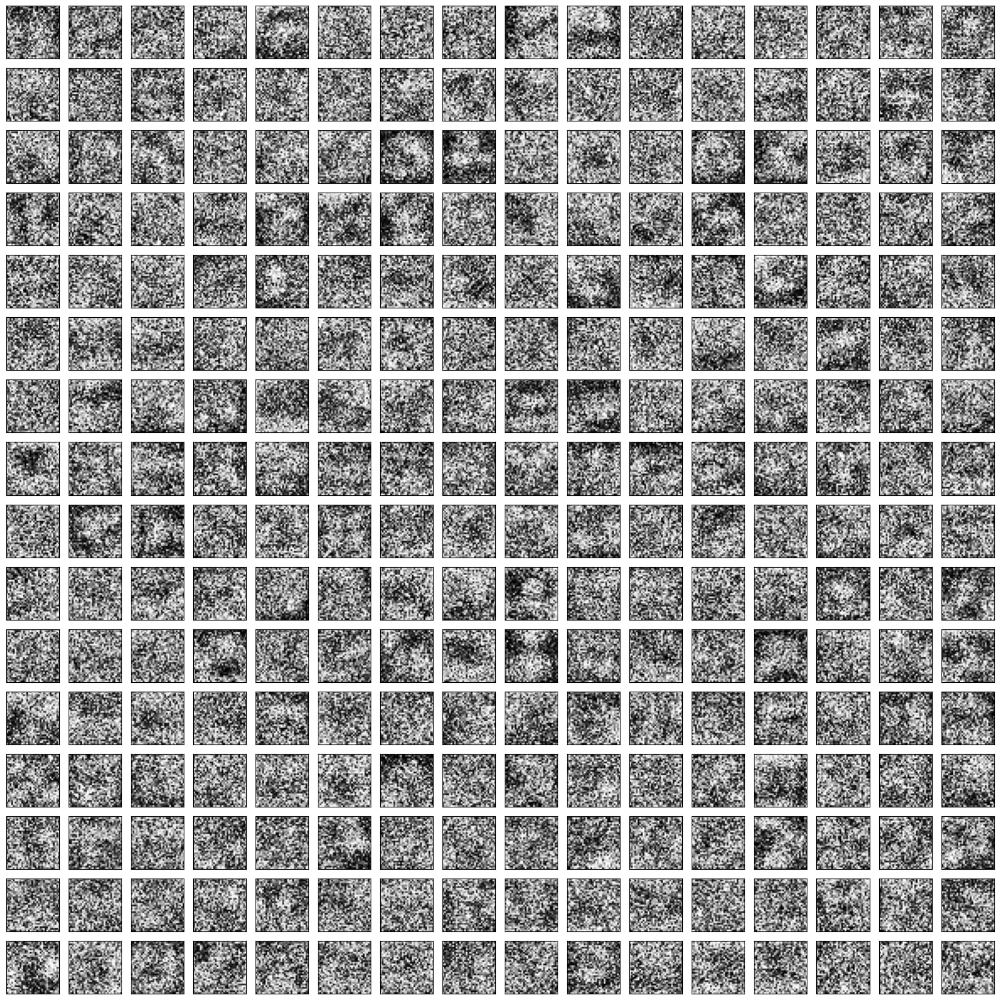

In [ ]:
# See generated images

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.imshow(X_gen[i].cpu().view(p, p), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

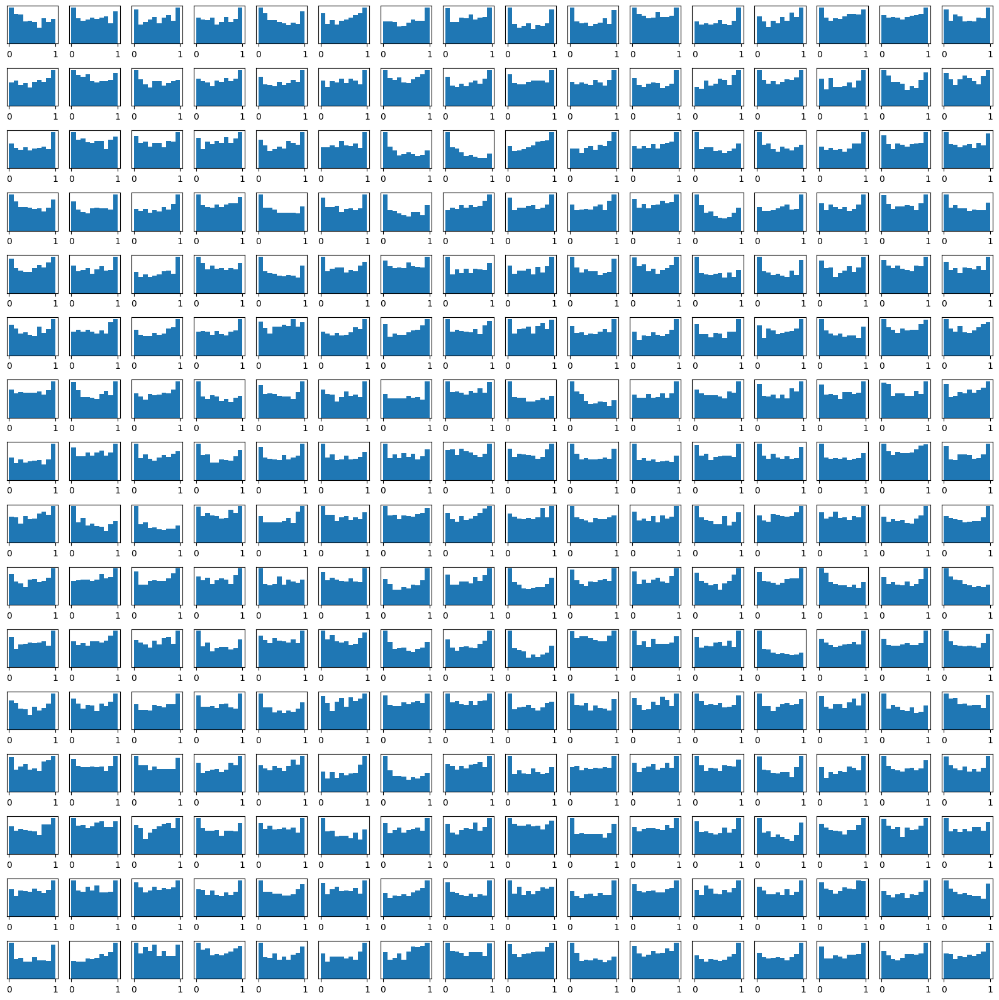

In [ ]:
# Check histogram distribution

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.hist(X_gen[i].cpu().view(-1)) 
    # ax.set_xlim(0,1)
    # ax.axis('off')
    # ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## (Optional) Check hidden unit histogram

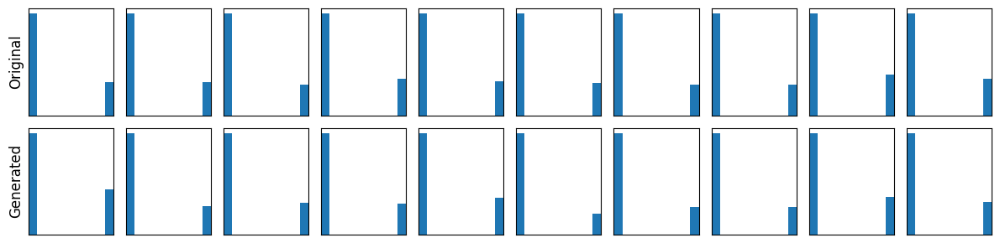

In [43]:
# Get hidden units
with torch.no_grad():
    h0 = rbm.v_to_h(X0.to(device)).detach() 
    h_gen = rbm.v_to_h(X_gen.to(device)).detach() 

# Plot
fig, axes = plt.subplots(2, 10, figsize=(12, 3))
for i in range(10):
    axes[0, i].hist(h0[i].cpu().view(-1)) 
    axes[0, i].set_xlim(0,1)
    # axes[0, i].axis("off")
    axes[0, i].set_xticks([])
    axes[0, i].set_yticks([])
    
    axes[1, i].hist(h_gen[i].cpu().view(-1)) 
    axes[1, i].set_xlim(0,1)
    # axes[1, i].axis("off")
    axes[1, i].set_xticks([])
    axes[1, i].set_yticks([])

axes[0, 0].set_ylabel("Original", fontsize=12)
axes[1, 0].set_ylabel("Generated", fontsize=12)

plt.tight_layout()
plt.show()

## (Optional) Check initial visible configurations and histogram

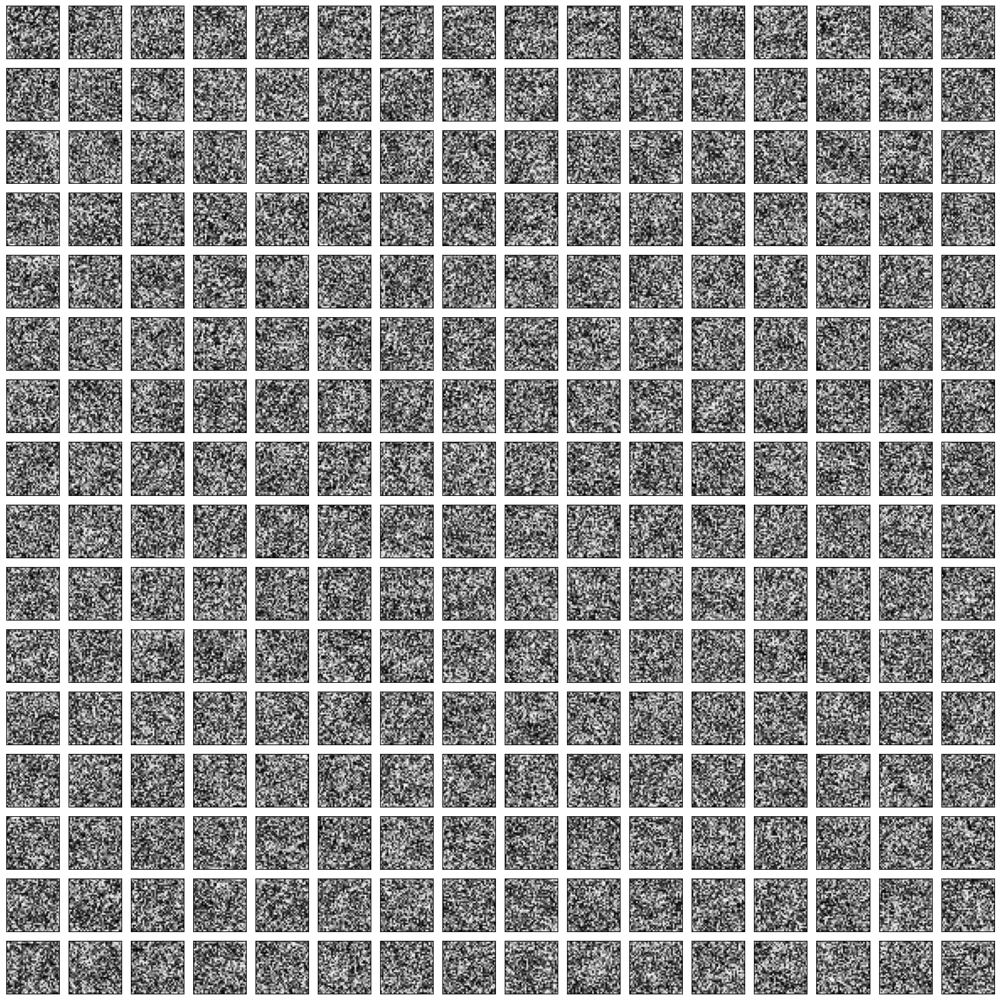

In [ ]:
# See images of initial random distribution

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.imshow(X0[i].detach().cpu().view(p, p), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

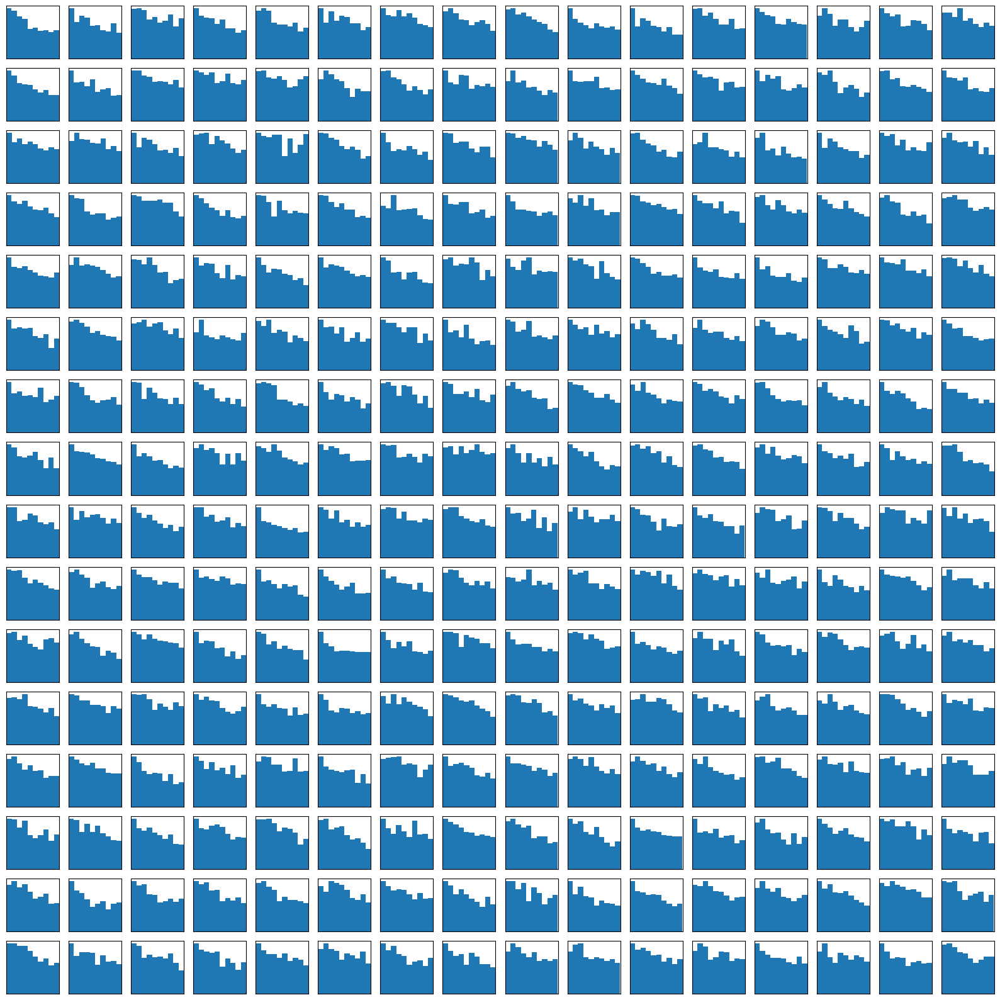

In [ ]:
# Check histogram distribution

fig = plt.figure(figsize=(16, 16)) 
for i in range(256):  # 16 × 16 grid
    ax = fig.add_subplot(16, 16, i + 1)
    ax.hist(X0[i].detach().cpu().view(-1)) 
    # ax.axis('off')
    ax.set_xlim(0,1)
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

## (Optional) Check PCD persistent v batch


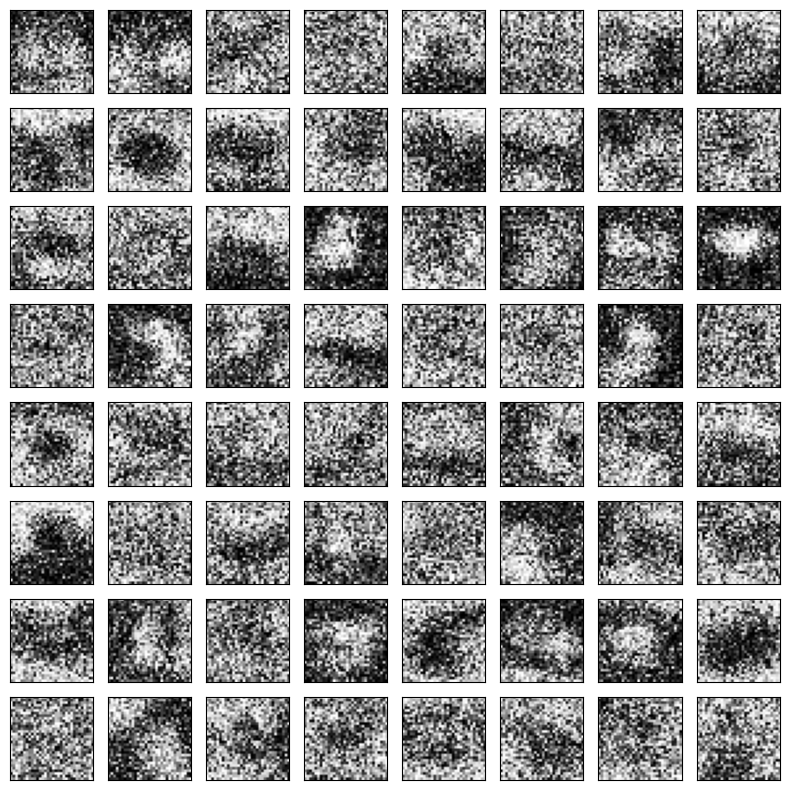

In [ ]:
# See images of the persistent batch

fig = plt.figure(figsize=(8, 8)) 
for i in range(64):  # 8 × 8 grid
    ax = fig.add_subplot(8, 8, i + 1)
    ax.imshow(rbm.persistent_v[i].cpu().view(p, p), cmap="gray")
    # ax.axis('off')
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()

# 7. Plot weight matrix W as filters (row vectors folded)

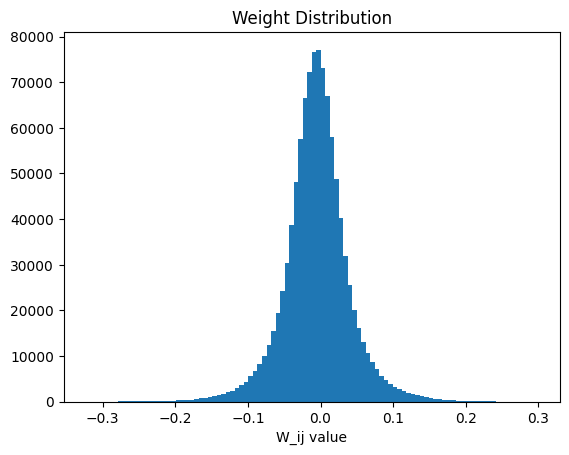

In [48]:
# Check weight distribution

plt.hist(rbm.W.detach().cpu().flatten(), bins=100)
plt.xlabel("W_ij value")
plt.title("Weight Distribution")
plt.show()

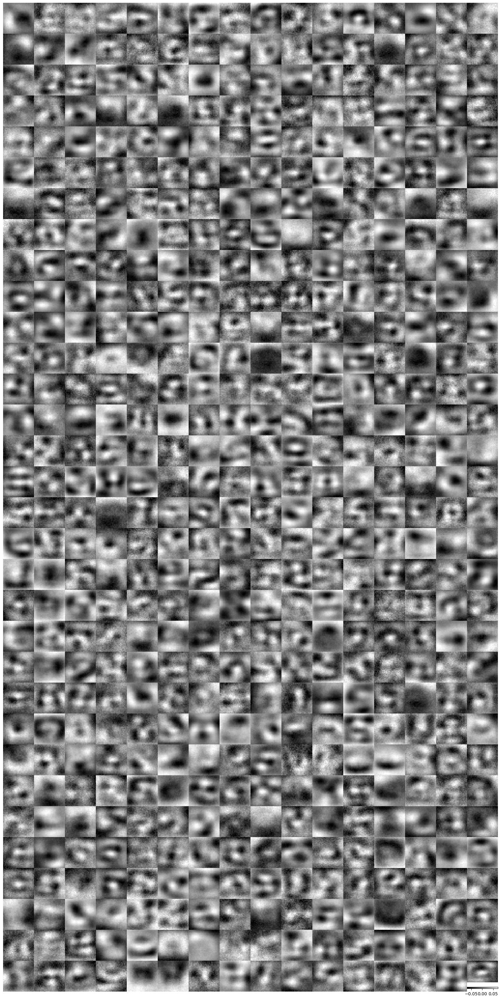

In [ ]:
# Visualize all weight filters as images

# Adjust rows and cols based on n_hidden. E.g., 16x16 for 256, 32x16 for 512
rows = 32
cols = 16

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols):
    ax = fig.add_subplot(rows, cols, i + 1)
    im = ax.imshow(rbm.W[i].detach().cpu().view(p, p), cmap="gray", aspect='auto')
    ax.axis('off')
    
plt.subplots_adjust(wspace=0, hspace=0, left=0, right=1, top=1, bottom=0)
plt.margins(0, 0)

# cbar = fig.colorbar(im, orientation='horizontal') #, fraction=0.05, pad=0.02)

plt.show()

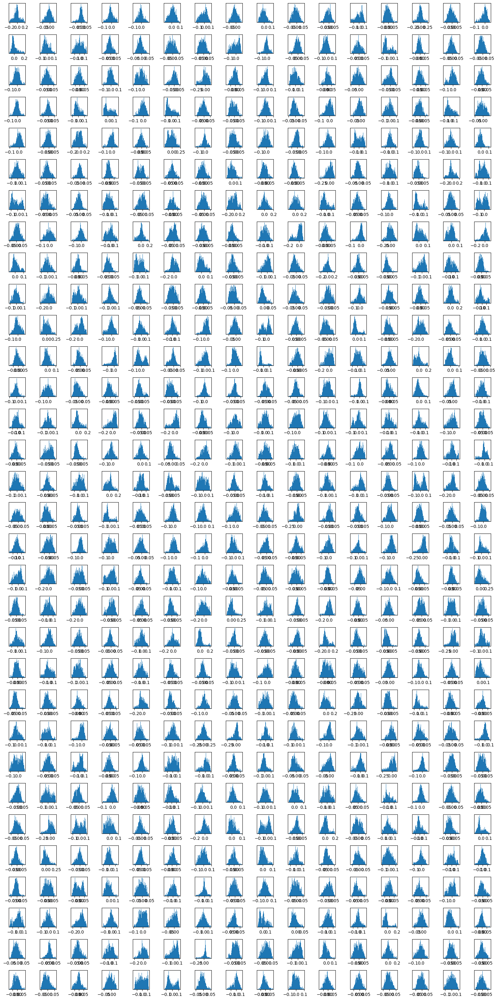

In [50]:
# Plot histograms of weight matrix filters

fig = plt.figure(figsize=(cols, rows)) 
for i in range(rows * cols): 
    ax = fig.add_subplot(rows, cols, i + 1)
    ax.hist(rbm.W[i].detach().cpu().view(-1), bins=50)
    # ax.axis('off')
    # ax.set_xticks([])
    ax.set_yticks([])
    
plt.tight_layout()
plt.show()

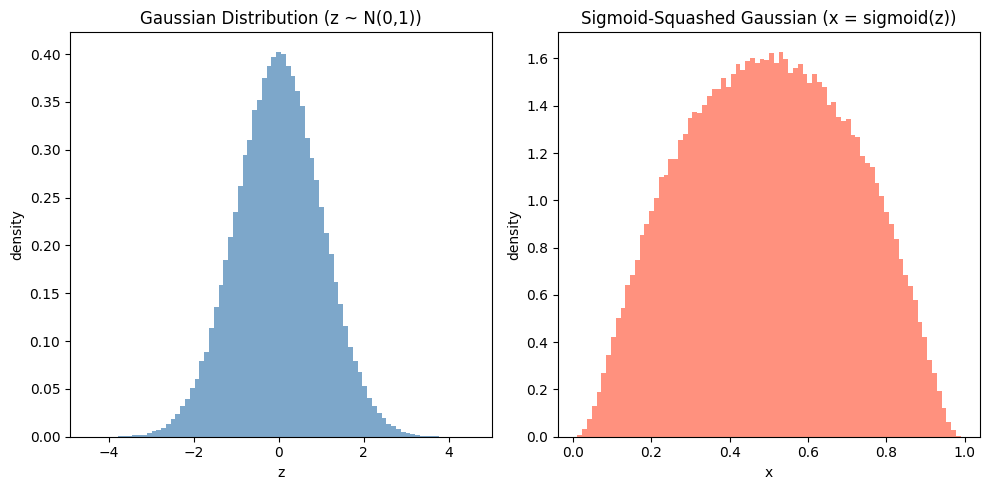

In [54]:
# Visualize the effect of sigmoid squashing on a Gaussian distribution

import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import norm

# Sample Gaussian
z = np.random.randn(200000)

# Squashed Gaussian-like
x = 1 / (1 + np.exp(-z))

plt.figure(figsize=(10,5))

# Plot Gaussian
plt.subplot(1,2,1)
plt.hist(z, bins=80, density=True, color='steelblue', alpha=0.7)
plt.title("Gaussian Distribution (z ~ N(0,1))")
plt.xlabel("z")
plt.ylabel("density")

# Plot squashed Gaussian
plt.subplot(1,2,2)
plt.hist(x, bins=80, density=True, color='tomato', alpha=0.7)
plt.title("Sigmoid-Squashed Gaussian (x = sigmoid(z))")
plt.xlabel("x")
plt.ylabel("density")

plt.tight_layout()
plt.show()

# The End